In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Predicting Rainfall Amount

#Importing Dataset

In [ ]:
df=pd.read_csv("weatherAUS.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
df.shape

(8425, 23)

- Dataset has 8425 rows and 23 columns

In [ ]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [ ]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

#Checking Null Values

In [ ]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [ ]:
size=df.shape[1]
a=[]
for i in range(size):
  col=df.iloc[:,i]
  x=col.isnull().sum()
  if x>0:
      loss=df.shape[0]*0.3
      if x>loss:
        a.append(df.columns[i])

for i in a:
  df=df.drop([i],axis=1)

In [ ]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [ ]:
df.dtypes


Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [ ]:
a=[]
b=[]
for i in df:
  if df[i].dtypes=='O':
    a.append(i)
  else:
    b.append(i)

from sklearn.impute import SimpleImputer

imp=SimpleImputer(missing_values=np.nan,strategy="most_frequent")
for i in a:
  df[i]=imp.fit_transform(df[i].values.reshape(-1,1))

for i in b:
  df[i]=df[i].fillna(df[i].mean())


- Extracting object type and float type into separate list.
- Performing mode on categorical data and mean on numerical data

In [ ]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   WindGustDir    8425 non-null   object 
 6   WindGustSpeed  8425 non-null   float64
 7   WindDir9am     8425 non-null   object 
 8   WindDir3pm     8425 non-null   object 
 9   WindSpeed9am   8425 non-null   float64
 10  WindSpeed3pm   8425 non-null   float64
 11  Humidity9am    8425 non-null   float64
 12  Humidity3pm    8425 non-null   float64
 13  Pressure9am    8425 non-null   float64
 14  Pressure3pm    8425 non-null   float64
 15  Cloud9am       8425 non-null   float64
 16  Cloud3pm       8425 non-null   float64
 17  Temp9am        8425 non-null   float64
 18  Temp3pm 

#Visualization

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


No     6435
Yes    1990
Name: RainToday, 

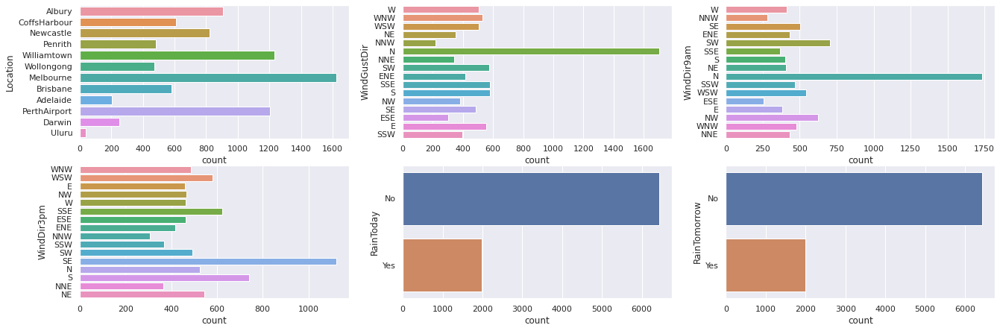

In [ ]:
sns.set()
fig,axes=plt.subplots(2,3,figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
k=0
j=0
for i in df.iloc[:,1:]:
  if df[i].dtypes=='O':
    sns.countplot(y=df[i],ax=axes[j,k])
    print(df[i].value_counts())
    print("\n")
    k=k+1

  
  if k==3:
    k=0
    j=j+1

In [ ]:
a=[]
for i in df["Date"]:
  a.append(i[:4])

b=[]
for i in a:
  if i not in b:
    b.append(i)
b

['2008',
 '2009',
 '2010',
 '2011',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2012']

- Finding the unique year value from Date

Number of times weather is forecasted at each Location between (2008-2017)         
- Melbourne       - 1622
- Williamtown     - 1230
- PerthAirport    - 1204
- Albury           - 907
- Newcastle        - 822
- CoffsHarbour     - 611
- Brisbane         - 579
- Penrith          - 482
- Wollongong       - 474
- Darwin           - 250
- Adelaide         - 205
- Uluru             - 39

Number of times each direction had strongest wind gust between (2008-2017) 
- N  (North) -    1704
- SSE (South-Southeast) -    578
- S (South) -      577
- SW (South-West) -     572
- E    (East) -   557
- WNW    (West-NorthWest) 531
- W (West)       507
- WSW  (West-Southwest) -   504
- SE   (South-East) -   484
- ENE  (East-Northeast) -   415
- SSW (South-Southwest) -    396
- NW   (North-West)   383
- NE   (North-East) -   353
- NNE  (North-NorthEast) -   343
- ESE   (East-SouthEast) -  302
- NNW  (North-Northwest) -   219


Number of times each direction had strongest Wind at 9am between (2008-2017)
- N      - 1735
- SW      - 704
- NW      - 625
- WSW     - 543
- SE      - 505
- WNW     - 480
- SSW     - 467
- ENE     - 433
- NNE     - 430
- W       - 414
- NE      - 409
- S       - 402
- E       - 380
- SSE     - 365
- NNW     - 280
- ESE     - 253

Number of times each direction had strongest Wind at 3pm between (2008-2017)
- SE     1121
- S       742
- SSE     623
- WSW     580
- NE      544
- N       524
- SW      494
- WNW     487
- NW      468
- W       462
- ESE     462
- E       460
- ENE     417
- SSW     370
- NNE     365
- NNW     306

RainToday between (2008-2017)
- 6435 times it was predicted that it wouldn't rain that day
- 1990 times it was predicted that it would rain that day

RainTomorrow between (2008-2017)   
- 6434 times it was predicted that it wouldn't rain the next day
- 1991 times it was predicted that it would rain the next day





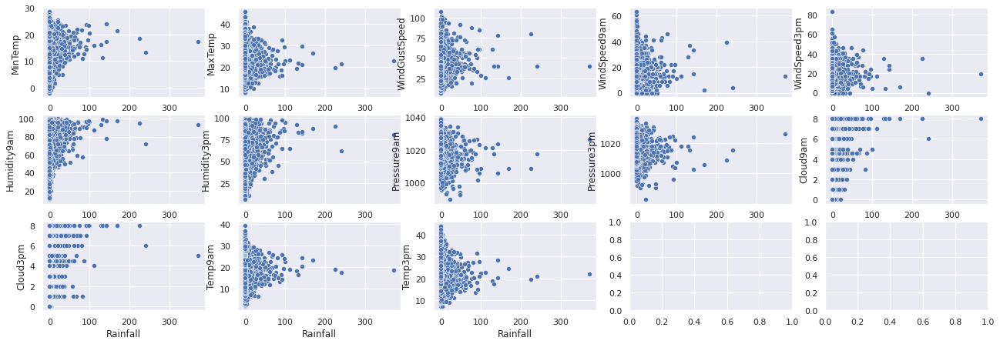

In [ ]:
sns.set()
fig,axes=plt.subplots(3,5,figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
k=0
j=0
for i in df.iloc[:,1:]:
  if df[i].dtypes=='float64' and i!="Rainfall":
    sns.scatterplot(x=df["Rainfall"],y=df[i],ax=axes[j,k])
    k=k+1

  
  if k==5:
    k=0
    j=j+1

- There is non linear distribution in all the above graph.

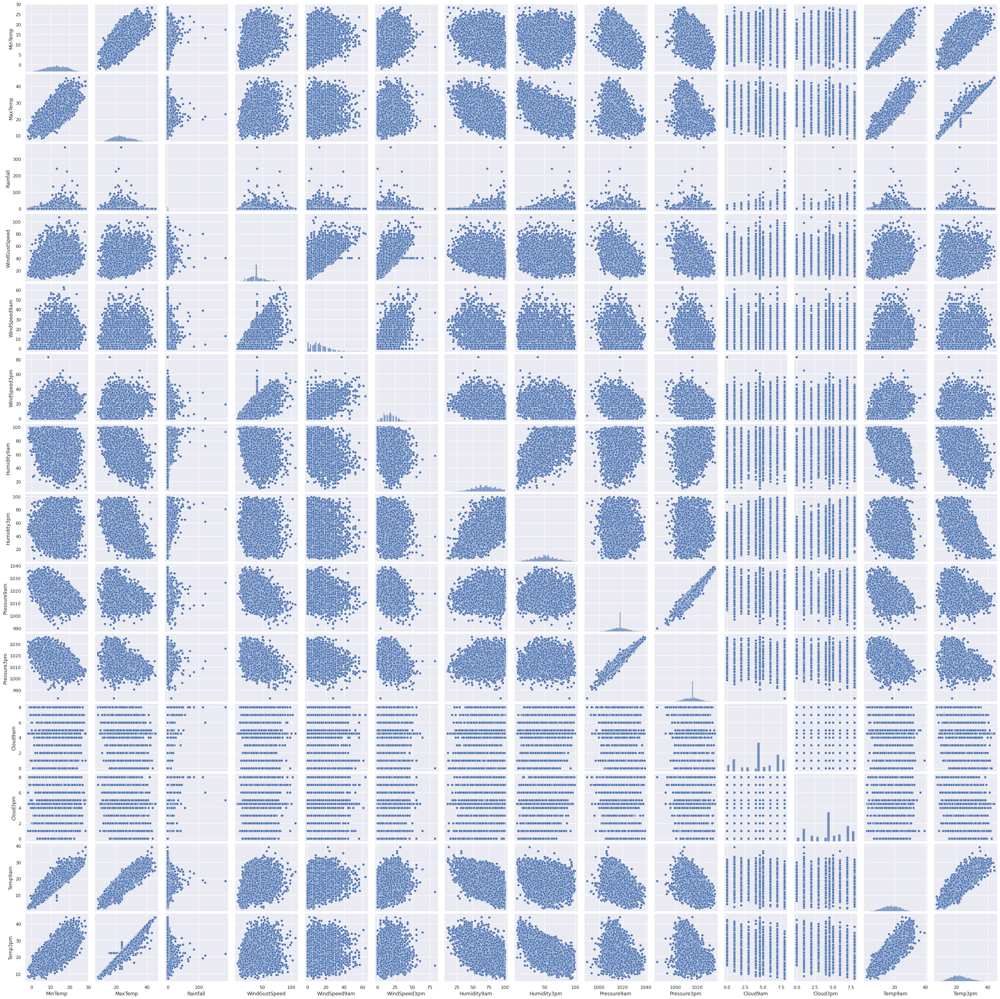

In [ ]:
sns.pairplot(df)

# Checking correlation

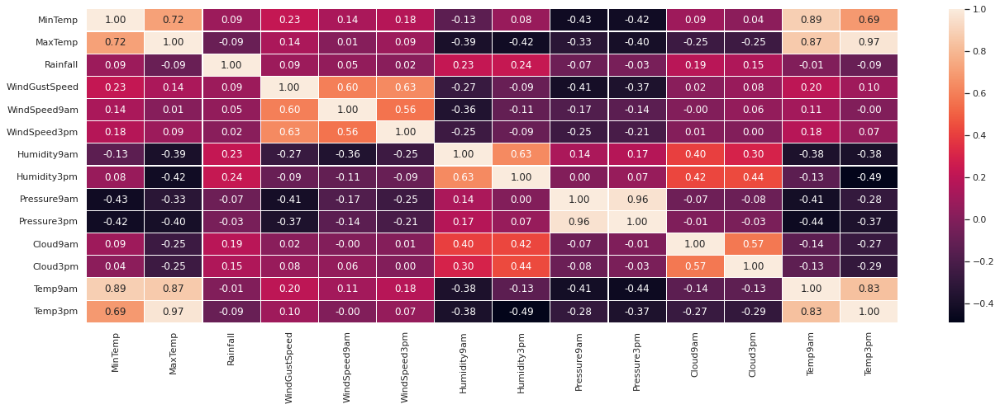

In [ ]:
plt.figure(figsize=(22,7))
sns.heatmap(df.corr(),annot=True,linecolor="white",linewidths=0.1,fmt="0.2f")

- MinTemp has 9 percent correlation with target column which is considered as a very weak +ve bond.
- MaxTemp has -9 percent correlation with target column which is considered as a weak -ve bond.
- WindGustSpeed has 9 percent correlation with target column which is considered as a very weak +ve bond.
- WindSpeed9am has 5 percent correlation with target column which is considered as a very weak +ve bond.
- WindSpeed3pm has 2 percent correlation with target column which is considered as a very weak +ve bond.
- Humidity9am has 23 percent correlation with target column which is considered as a weak +ve bond.
- Humidity3pm has 24 percent correlation with target column which is considered as a weak +ve bond.
- Pressure9am has -7 percent correlation with target column which is considered as a weak -ve bond.
- Pressure3pm has -3 percent correlation with target column which is considered as a weak -ve bond.
- Cloud9am has 19 percent correlation with target column which is considered as a very weak +ve bond.
- Cloud3pm has 15 percent correlation with target column which is considered as a very weak +ve bond.
- Temp9am has -1 percent correlation with target column which is considered as a very weak -ve bond.
- Temp3pm has -9 percent correlation with target column which is considered as a weak -ve bond.

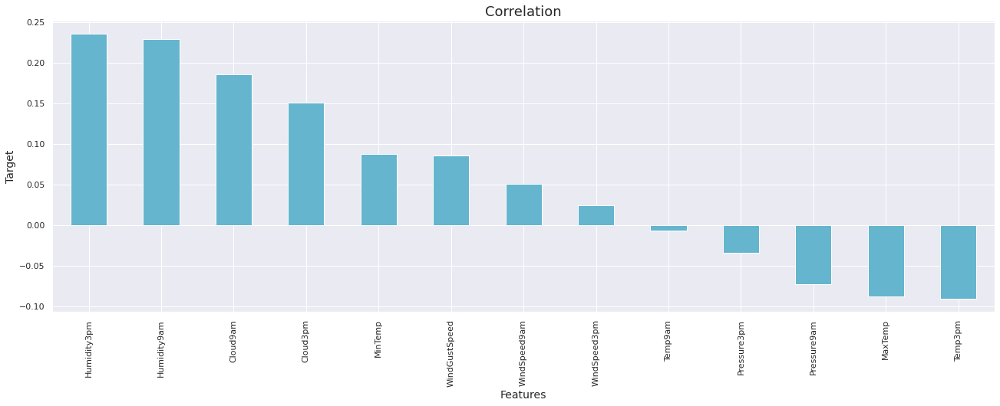

In [ ]:
plt.figure(figsize=(22,7))
df.corr()["Rainfall"].sort_values(ascending=False).drop(["Rainfall"]).plot(kind="bar",color="c")
plt.xlabel('Features',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

- Max +ve correlation - Humidity3pm
- Min +ve correlation - WindSpeed3pm
- Max -ve correlation - Temp3pm
- Min -ve correlation - Temp9am

#Describing Data

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.379488,6.114516,10.309308,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.200000,23.300000,0.000000,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


- There is huge gap between 75% and Max value which indicates presence of outlier in some of the features.

- Data is widely spread in most of the features.

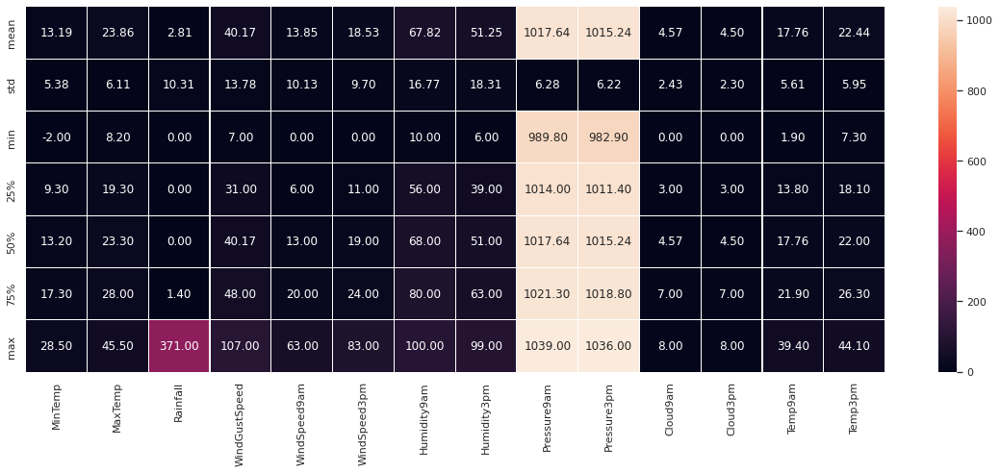

In [ ]:
plt.figure(figsize=(20,7))
sns.heatmap(df.describe()[1:],annot=True,linewidths=0.1,linecolor="white",fmt="0.2f")

MinTemp	
- mean -	13.193305	
- std	- 5.379488
- min	- -2.000000
- max -	28.500000	

MaxTemp	
- mean -	23.859976
- std	- 6.114516
- min	- 8.200000	
- max -	45.500000	

Rainfall	
- mean -	2.805913
- std	- 10.309308	
- min	- 0.000000	
- max -	371.000000

WindGustSpeed	
- mean -	40.174469	
- std	- 	13.776101	
- min	- 7.000000
- max -	107.000000	

WindSpeed9am	
- mean -	13.847646	
- std	- 10.128579	
- min	- 	0.000000
- max -	63.000000	

WindSpeed3pm	
- mean -	18.533662	
- std	- 	9.704759	
- min	- 	0.000000	
- max -		83.000000	

Humidity9am	
- mean -		67.822496	
- std	- 16.774231	
- min	- 10.000000	
- max -	100.000000	

Humidity3pm	
- mean -	51.249790	
- std	- 	18.311894	
- min	- 6.000000	
- max -	99.000000	

Pressure9am	
- mean -	1017.640233	
- std	- 6.275759	
- min	- 989.800000	
- max -	1039.000000	

Pressure3pm	
- mean -		1015.236075	
- std	- 6.217451	
- min	-	982.900000	
- max -	1036.000000	

Cloud9am	
- mean -	4.566622	
- std	- 2.429205	
- min	- 0.000000	
- max -	8.000000	

Cloud3pm	
- mean -	4.503183	
- std	- 2.299419	
- min	- 0.000000	
- max -	8.000000	

Temp9am	
- mean -	17.762015	
- std	- 5.608301
- min	- 1.900000	
- max -	39.400000	

Temp3pm
- mean -	22.442934
- std	- 5.945849
- min	- 7.300000
- max -	44.100000

#Detecting Outliers

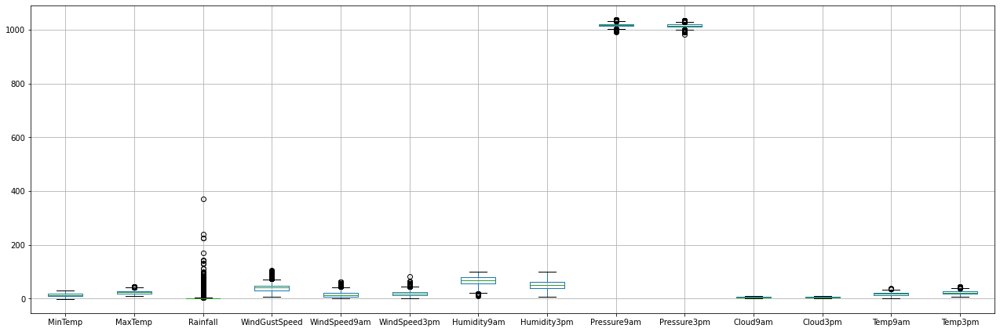

In [ ]:
df.iloc[:,:].boxplot(figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
plt.show()

- Except MinTemp, Humidity3pm, Cloud9am,Cloud3pm, all the other features have outliers

In [ ]:
new_df_cap=df.copy()

In [ ]:
def remove_outliers(n):
  Q3=np.percentile(df[n],75,interpolation="midpoint")
  Q1=np.percentile(df[n],25,interpolation="midpoint")
  iqr=Q3-Q1
  percentile25=df[n].quantile(0.25)
  percentile75=df[n].quantile(0.75)
  upper_limit=percentile75+1.5*iqr
  lower_limit=percentile25-1.5*iqr
  df[df[n]>upper_limit]
  df[df[n]<lower_limit]

  new_df=df[df[n]<upper_limit]
  
  new_df_cap[n]=np.where(
      new_df_cap[n] > upper_limit,
      upper_limit,
      np.where(
          new_df_cap[n] < lower_limit,
          lower_limit,
          new_df_cap[n] ) 
      )
  sns.boxplot(new_df_cap[n])

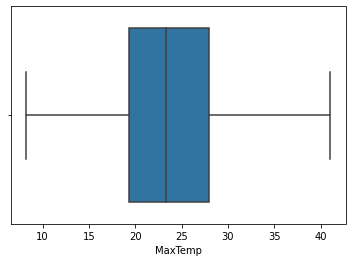

In [ ]:
remove_outliers("MaxTemp")

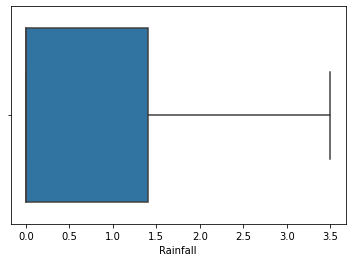

In [ ]:
remove_outliers("Rainfall")

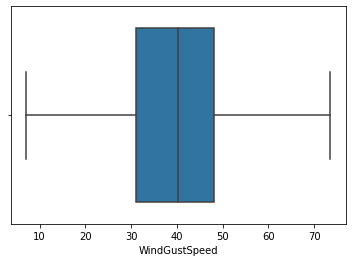

In [ ]:
remove_outliers("WindGustSpeed")

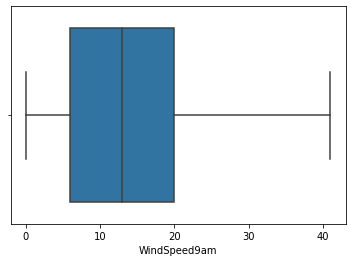

In [ ]:
remove_outliers("WindSpeed9am")

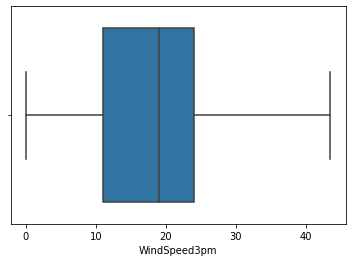

In [ ]:
remove_outliers("WindSpeed3pm")

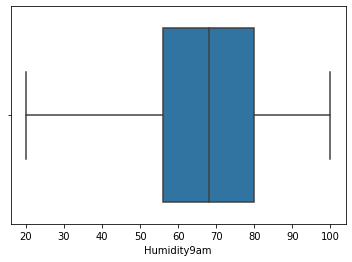

In [ ]:
remove_outliers("Humidity9am")

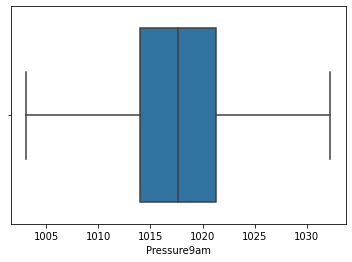

In [ ]:
remove_outliers("Pressure9am")

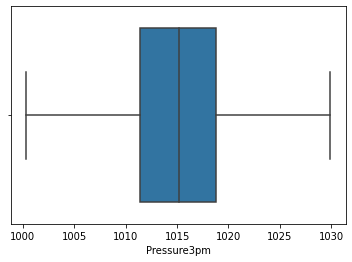

In [ ]:
remove_outliers("Pressure3pm")

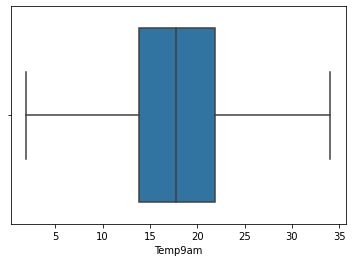

In [ ]:
remove_outliers("Temp9am")

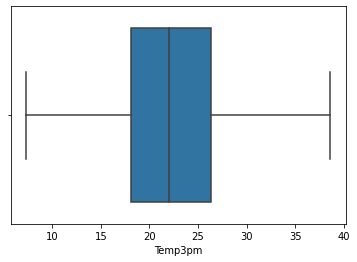

In [ ]:
remove_outliers("Temp3pm")

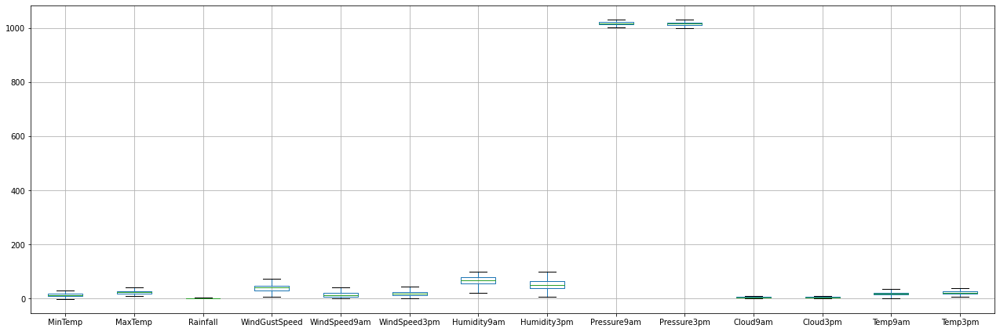

In [ ]:
new_df_cap.iloc[:,:].boxplot(figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
plt.show()

# Encoding Categorical Features

In [ ]:
new_df_cap.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [ ]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()
for i in new_df_cap:
  if new_df_cap[i].dtypes==object:
    new_df_cap[i]=enc.fit_transform(new_df_cap[i].values.reshape(-1,1))

In [ ]:
new_df_cap.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


#Separating input and output features

In [ ]:
x=new_df_cap.drop(["Rainfall"],axis=1)
x.head()

,Date,Location,MinTemp,MaxTemp,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.9,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,1,1,7.4,25.1,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2,1,12.9,25.7,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,4,1,17.5,32.3,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


In [ ]:
y=new_df_cap["Rainfall"]
y.head()

0    0.6
1    0.0
2    0.0
3    0.0
4    1.0
Name: Rainfall, dtype: float64

#Checking Skewness

In [ ]:
x.skew().sort_values()

Cloud9am        -0.366503
Cloud3pm        -0.276294
Humidity9am     -0.241038
WindDir3pm      -0.119847
MinTemp         -0.089989
Location        -0.050456
Temp9am         -0.021897
Pressure9am     -0.002350
Pressure3pm      0.014310
Humidity3pm      0.118281
WindGustDir      0.119640
WindDir9am       0.172792
WindSpeed3pm     0.334774
Temp3pm          0.357148
MaxTemp          0.358988
Date             0.386560
WindGustSpeed    0.508772
WindSpeed9am     0.737551
RainTomorrow     1.241588
RainToday        1.242362
dtype: float64

Keeping +/- 0.5 as the skew range, following features can be considered skewed
- WindGustSpeed
- WindSpeed9am
- RainTomorrow
- RainToday

Since WindGustSpeed, WindSpeed9am are the only two non categorical feature with skewness, hence its skewness can be removed

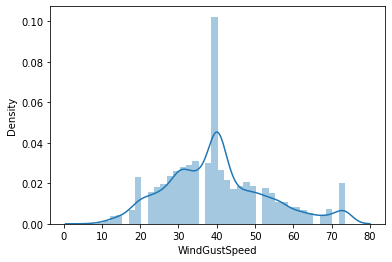

In [ ]:
sns.distplot(x["WindGustSpeed"])

- The feature is right skewed

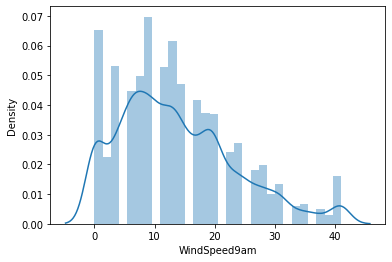

In [ ]:
sns.distplot(x["WindSpeed9am"])

- The feature is right skewed

In [ ]:
from sklearn.preprocessing import power_transform
x["WindGustSpeed"]=power_transform(x["WindGustSpeed"].values.reshape(-1,1))
x["WindSpeed9am"]=power_transform(x["WindSpeed9am"].values.reshape(-1,1))

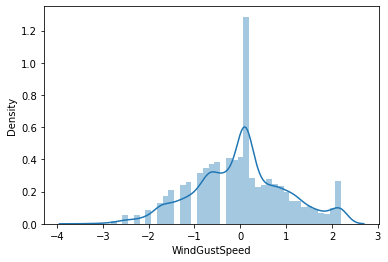

In [ ]:
sns.distplot(x["WindGustSpeed"])

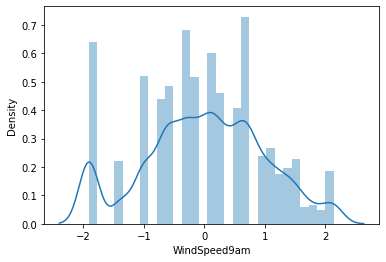

In [ ]:
sns.distplot(x["WindSpeed9am"])

- The feature is not normally distributed, hence we test further.

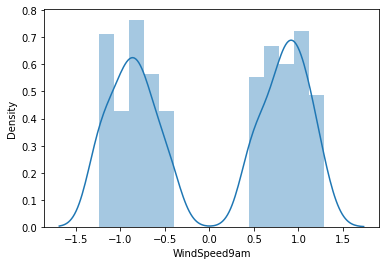

In [ ]:
n=np.cbrt(x["WindSpeed9am"])
sns.distplot(n)

- There is improvement in the distribution

In [ ]:
x["WindSpeed9am"]=np.cbrt(x["WindSpeed9am"])
x["WindSpeed9am"].skew()

-0.05007020032907847

In [ ]:
x.skew().sort_values()

Cloud9am        -0.366503
Cloud3pm        -0.276294
Humidity9am     -0.241038
WindDir3pm      -0.119847
MinTemp         -0.089989
Location        -0.050456
WindSpeed9am    -0.050070
Temp9am         -0.021897
Pressure9am     -0.002350
WindGustSpeed   -0.000907
Pressure3pm      0.014310
Humidity3pm      0.118281
WindGustDir      0.119640
WindDir9am       0.172792
WindSpeed3pm     0.334774
Temp3pm          0.357148
MaxTemp          0.358988
Date             0.386560
RainTomorrow     1.241588
RainToday        1.242362
dtype: float64

# Detecting Multicollinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
  vif=pd.DataFrame()
  vif["variable"]=X.columns
  vif["VIF"]=[variance_inflation_factor(X.values,i) for i in range(X.shape[1]) ]

  return (vif)

In [ ]:
calc_vif(x)

,variable,VIF
0,Date,4.837631
1,Location,6.771435
2,MinTemp,57.850161
3,MaxTemp,421.247857
4,WindGustDir,5.320754
5,WindGustSpeed,2.266734
6,WindDir9am,4.704148
7,WindDir3pm,6.020603
8,WindSpeed9am,1.821093
9,WindSpeed3pm,9.480748


- Since VIF>5, it indicates presence of multicollinearity
- After looking at the correlation matrix, it was observed that the "Pressure3pm","Temp3pm" contribution towards the target column is slightly less, hence we drop these features.

In [ ]:
X=x.drop(["Pressure3pm","Temp3pm"],axis=1)
calc_vif(X)

,variable,VIF
0,Date,4.836755
1,Location,6.760178
2,MinTemp,56.399599
3,MaxTemp,147.993566
4,WindGustDir,5.271113
5,WindGustSpeed,2.243347
6,WindDir9am,4.630289
7,WindDir3pm,5.737459
8,WindSpeed9am,1.820836
9,WindSpeed3pm,9.433116


#Scaling 

In [ ]:
from sklearn.preprocessing import MinMaxScaler
mns=MinMaxScaler()
s=mns.fit_transform(X)
x=pd.DataFrame(data=s)
print(x)


            0         1         2         3         4         5         6   \
0     0.000000  0.090909  0.504918  0.447489  0.866667  0.678135  0.866667   
1     0.000333  0.090909  0.308197  0.514460  0.933333  0.678135  0.400000   
2     0.000666  0.090909  0.488525  0.532725  1.000000  0.703070  0.866667   
3     0.000999  0.090909  0.367213  0.602740  0.266667  0.385490  0.600000   
4     0.001332  0.090909  0.639344  0.733638  0.866667  0.639577  0.066667   
...        ...       ...       ...       ...       ...       ...       ...   
8420  0.998668  0.818182  0.157377  0.462709  0.000000  0.498905  0.600000   
8421  0.999001  0.818182  0.183607  0.520548  0.400000  0.349983  0.600000   
8422  0.999334  0.818182  0.242623  0.569254  0.200000  0.585760  0.600000   
8423  0.999667  0.818182  0.321311  0.572298  0.600000  0.452140  0.666667   
8424  1.000000  0.818182  0.554098  0.476712  0.200000  0.628706  0.133333   

            7         8         9       10        11        12 

# Training and Testing

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,accuracy_score,classification_report,auc,roc_curve
from sklearn.model_selection import train_test_split,cross_val_score
lr=LinearRegression()


In [ ]:
for i in range(100):
  x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
  lr.fit(x,y)
  pred_train=lr.predict(x_train)
  pred_test=lr.predict(x_test)
  print("At Random State : ",i)
  print(f"At random state {i}, training accuracy: {r2_score(y_train,pred_train)}")
  print(f"At random state {i}, testing accuracy: {r2_score(y_test,pred_test)}")
  print("\n")

At Random State :  0
At random state 0, training accuracy: 0.8147631673080096
At random state 0, testing accuracy: 0.8168481569274257


At Random State :  1
At random state 1, training accuracy: 0.8147734010952188
At random state 1, testing accuracy: 0.8168408831778753


At Random State :  2
At random state 2, training accuracy: 0.8121105475963439
At random state 2, testing accuracy: 0.8270867232927208


At Random State :  3
At random state 3, training accuracy: 0.8161956473733822
At random state 3, testing accuracy: 0.8112910383855642


At Random State :  4
At random state 4, training accuracy: 0.8143743873681613
At random state 4, testing accuracy: 0.818639915190766


At Random State :  5
At random state 5, training accuracy: 0.8174222290625973
At random state 5, testing accuracy: 0.8061482939915947


At Random State :  6
At random state 6, training accuracy: 0.8144337773685577
At random state 6, testing accuracy: 0.8183659297067316


At Random State :  7
At random state 7, training 

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=99)
lr.fit(x,y)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)
print(f"Training Accuracy: {round(r2_score(y_train,pred_train)*100,2)}")
print(f"Testing Accuracy: {round(r2_score(y_test,pred_test)*100,2)}")


Training Accuracy: 81.47
Testing Accuracy: 81.72


In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print("Mean Absolute Error ",mean_absolute_error(y_test,pred_test))
print("Mean Sq. Error ",mean_squared_error(y_test,pred_test))
print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,pred_test)))

Mean Absolute Error  0.33933262183532115
Mean Sq. Error  0.3340854457234978
Root Mean Sq  0.5780012506245101


#Cross Validation

In [ ]:
ls=r2_score(y_test,pred_test)

for j in range(2,20):
  cv_score=cross_val_score(lr,x,y,cv=j)
  print(cv_score)
  print("At cv:",j)
  print("cv score : ", cv_score.mean()*100)
  print("Accuracy : ",ls*100)
  print("\n")

[0.81623922 0.79519545]
At cv: 2
cv score :  80.57173320991086
Accuracy :  81.7209827022483


[0.86355724 0.74522049 0.82644809]
At cv: 3
cv score :  81.17419416134611
Accuracy :  81.7209827022483


[0.87309177 0.77382926 0.70082728 0.90049163]
At cv: 4
cv score :  81.20599834877196
Accuracy :  81.7209827022483


[0.88320902 0.79705053 0.79978386 0.68539226 0.89416677]
At cv: 5
cv score :  81.19204889263303
Accuracy :  81.7209827022483


[0.87316391 0.85743689 0.74061327 0.75113296 0.75106386 0.91246248]
At cv: 6
cv score :  81.43122267848514
Accuracy :  81.7209827022483


[0.87291805 0.86425478 0.78478811 0.79674925 0.66949924 0.80970335
 0.90651618]
At cv: 7
cv score :  81.4918421450139
Accuracy :  81.7209827022483


[0.87039804 0.8773241  0.83140018 0.71777267 0.75446756 0.66299486
 0.89784234 0.91022048]
At cv: 8
cv score :  81.53025288662488
Accuracy :  81.7209827022483


[0.86420687 0.87823869 0.85671343 0.75384835 0.78941787 0.69706847
 0.70098822 0.8992121  0.90772265]
At cv: 9

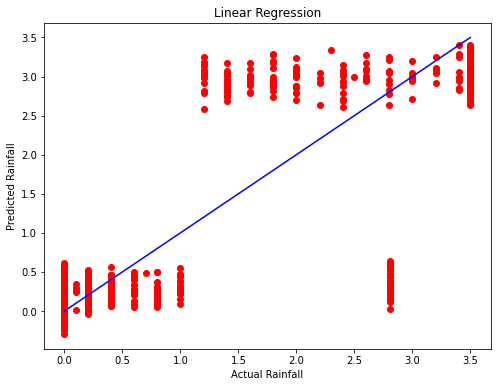

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
plt.scatter(x=y_test,y=pred_test,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Linear Regression")
plt.show()

# Regularization

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso

parameters={'alpha':[.0001,.001,.01,.1,1,10],
            'random_state': list(range(0,10)),
            'selection':['cyclic', 'random'],
            'fit_intercept': ['True','False']}
ls=Lasso()
clf=GridSearchCV(ls,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 0.0001, 'fit_intercept': 'True', 'random_state': 8, 'selection': 'random'}


In [ ]:
ls=Lasso(alpha=0.0001,random_state=8,fit_intercept=True,selection='random')
ls.fit(x_train,y_train)
ls_score_train=ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
print("Training Accuracy: ",round(ls_score_train*100,2))

Training Accuracy:  81.48


In [ ]:
lss=r2_score(y_test,pred_ls)
print("Testing Accuracy: ",round(lss*100,2))

Testing Accuracy:  81.64


In [ ]:
cv_score=cross_val_score(ls,x,y,cv=5)
cv_mean=cv_score.mean()
print("Cross Validation Score: ",round(cv_mean*100,2))

Cross Validation Score:  81.2


#Model Selection

In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

def model_selection(algorithm_instance,x_train,y_train,x_test,y_test):
    algorithm_instance.fit(x_train,y_train)
    model_pred_train=algorithm_instance.predict(x_train)
    model_pred_test=algorithm_instance.predict(x_test)
    print("Accuracy of training model :",round(r2_score(y_train,model_pred_train)*100,2))
    print("Accuracy of test data :",round(r2_score(y_test,model_pred_test)*100,2))
    rfscore=cross_val_score(algorithm_instance,x,y,cv=5)
    rfc=rfscore.mean()
    print('Cross Val Score:',round(rfc*100,2))
    print("\nMean Absolute Error ",mean_absolute_error(y_test,model_pred_test))
    print("Mean Sq. Error ",mean_squared_error(y_test,model_pred_test))
    print("Root Mean Sq ",np.sqrt(mean_squared_error(y_test,model_pred_test)))
    print("\n")

# SVR

In [ ]:
from sklearn import svm

k=svm.SVR()
model_selection(k,x_train,y_train,x_test,y_test)

Accuracy of training model : 82.81
Accuracy of test data : 81.09
Cross Val Score: 80.71

Mean Absolute Error  0.2688553833768566
Mean Sq. Error  0.3455829888559879
Root Mean Sq  0.5878630698181235




# DecisioTreeRegressor

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dtc = DecisionTreeRegressor()
model_selection(dtc,x_train,y_train,x_test,y_test)

Accuracy of training model : 100.0
Accuracy of test data : 84.69
Cross Val Score: 74.01

Mean Absolute Error  0.1862770755652393
Mean Sq. Error  0.279892648716578
Root Mean Sq  0.5290488150601775




# XGBOOST

In [ ]:
import xgboost as xg
xgb = xg.XGBRegressor()
model_selection(xgb,x_train,y_train,x_test,y_test)

[06:08:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Accuracy of training model : 87.32
Accuracy of test data : 85.21
[06:08:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:08:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:08:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:08:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:08:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Cross Val Score: 83.03

Mean Absolute Error  0.30274062874169017
Mean Sq. Error  0.27030028406341533
Root Mean Sq  0.5199041104505862




# Ensemble Methods

# RandomForestRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

parameter={'criterion':['mse','mae'],
          'max_features' : ["auto","sqrt","log2"],
           'n_estimators':range(0,100,25)}

rf=RandomForestRegressor()
clf=GridSearchCV(rf,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'mse', 'max_features': 'auto', 'n_estimators': 75}


In [ ]:
rf=RandomForestRegressor(criterion='mse',max_features="auto", n_estimators=75)
model_selection(rf,x_train,y_train,x_test,y_test)

Accuracy of training model : 98.76
Accuracy of test data : 91.51
Cross Val Score: 84.32

Mean Absolute Error  0.21276442262781964
Mean Sq. Error  0.1551690251227724
Root Mean Sq  0.3939149973316228




# AdaBoostRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostRegressor

parameter={'loss':['linear', 'square', 'exponential'],
          'random_state' : range(0,100,25),
           'learning_rate':[0,1.0],
           'n_estimators':range(0,100,25)}

rf2=AdaBoostRegressor()
clf=GridSearchCV(rf2,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'learning_rate': 1.0, 'loss': 'linear', 'n_estimators': 25, 'random_state': 25}


In [ ]:
rf2=AdaBoostRegressor(learning_rate= 1.0, loss= 'linear', n_estimators= 25, random_state= 25)
model_selection(rf2,x_train,y_train,x_test,y_test)

Accuracy of training model : 74.6
Accuracy of test data : 73.78
Cross Val Score: 72.75

Mean Absolute Error  0.568606243245149
Mean Sq. Error  0.4792943612816432
Root Mean Sq  0.692310884849894




# GradientBoostingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

parameter={'loss':['squared_error', 'absolute_error', 'huber','quantile'],
          'criterion':['friedman_mse', 'squared_error', 'mse'],
           'learning_rate':[0,1.0],
           'n_estimators':range(0,100,25)}

rf3=GradientBoostingRegressor()
clf=GridSearchCV(rf3,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'friedman_mse', 'learning_rate': 1.0, 'loss': 'squared_error', 'n_estimators': 25}


In [ ]:
rf3=GradientBoostingRegressor(learning_rate= 1.0, loss= 'squared_error', n_estimators= 25, criterion= 'friedman_mse')
model_selection(rf3,x_train,y_train,x_test,y_test)

Accuracy of training model : 88.81
Accuracy of test data : 84.57
Cross Val Score: 75.12

Mean Absolute Error  0.32958328713621843
Mean Sq. Error  0.28193548792710543
Root Mean Sq  0.5309759767890685




# BaggingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor

parameter={'oob_score':['True','False'],
          'n_jobs':range(0,10,2),
           'random_state':range(0,100,25),
           'n_estimators':range(0,100,25)}

rf4=BaggingRegressor()
clf=GridSearchCV(rf4,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_estimators': 75, 'n_jobs': 2, 'oob_score': 'True', 'random_state': 25}


In [ ]:
rf4=BaggingRegressor(oob_score= True, n_jobs= 2, n_estimators= 75, random_state= 25)
model_selection(rf4,x_train,y_train,x_test,y_test)

Accuracy of training model : 98.79
Accuracy of test data : 91.57
Cross Val Score: 84.41

Mean Absolute Error  0.20942398063573142
Mean Sq. Error  0.15410705110062406
Root Mean Sq  0.39256470944370947




# VotingRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

estimators = [ ('knc', KNeighborsRegressor()), ('svr',SVR()) ]
parameter={
          'n_jobs':range(0,10,2),
           'verbose':[True,False]
          }

rf5=VotingRegressor(estimators)
clf=GridSearchCV(rf5,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_jobs': 2, 'verbose': True}


In [ ]:
rf5=VotingRegressor(estimators, n_jobs= 2, verbose= True)
model_selection(rf5,x_train,y_train,x_test,y_test)

Accuracy of training model : 87.57
Accuracy of test data : 83.33
Cross Val Score: 80.75

Mean Absolute Error  0.2784809742270959
Mean Sq. Error  0.3047135117130381
Root Mean Sq  0.5520086156148635




#Saving Model

In [ ]:
import pickle
filename='rfz.pk1'
pickle.dump(rf4,open(filename,'wb'))

#Loading Saved Model

We selected RandomForest Regressor model since
- it has best cross validation score among all the model and high accuracy.
- it also has least Mean Absolute Error, Mean Sq. Error, Root Mean Sq 

In [ ]:
loaded_model=pickle.load(open('rfz.pk1','rb'))
result=loaded_model.score(x_test,y_test)
print("\nModel Accuracy:",result*100)
pred_decision=rf4.predict(x_test)


Model Accuracy: 91.56824851596436


# Testing Loaded Model

In [ ]:
conc=pd.DataFrame([loaded_model.predict(x_test)[:],pred_decision[:]],index=["Predicted Rainfall","Actual Rainfall"])
conc

,0,1,2,3,4,5,6,7,8,9,...,1675,1676,1677,1678,1679,1680,1681,1682,1683,1684
Predicted Rainfall,3.104,0.112158,0.189728,0.277333,0.114746,2.324888,0.04,0.037412,0.042667,0.016,...,0.042667,0.034667,0.021333,0.029333,0.109333,0.134824,0.080158,0.493964,0.013333,0.010667
Actual Rainfall,3.104,0.112158,0.189728,0.277333,0.114746,2.324888,0.04,0.037412,0.042667,0.016,...,0.042667,0.034667,0.021333,0.029333,0.109333,0.134824,0.080158,0.493964,0.013333,0.010667


#2. Predicting Rainfall for Tomorrow

#Importing Dataset

In [ ]:
df=pd.read_csv("weatherAUS.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
df.shape

(8425, 23)

- Dataset has 8425 rows and 23 columns

In [ ]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [ ]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

#Checking Null Values

In [ ]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [ ]:
size=df.shape[1]
a=[]
for i in range(size):
  col=df.iloc[:,i]
  x=col.isnull().sum()
  if x>0:
      loss=df.shape[0]*0.3
      if x>loss:
        a.append(df.columns[i])

for i in a:
  df=df.drop([i],axis=1)

In [ ]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [ ]:
df.dtypes


Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [ ]:
a=[]
b=[]
for i in df:
  if df[i].dtypes=='O':
    a.append(i)
  else:
    b.append(i)

from sklearn.impute import SimpleImputer

imp=SimpleImputer(missing_values=np.nan,strategy="most_frequent")
for i in a:
  df[i]=imp.fit_transform(df[i].values.reshape(-1,1))

for i in b:
  df[i]=df[i].fillna(df[i].mean())


- Extracting object type and float type into separate list.
- Performing mode on categorical data and mean on numerical data

In [ ]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   WindGustDir    8425 non-null   object 
 6   WindGustSpeed  8425 non-null   float64
 7   WindDir9am     8425 non-null   object 
 8   WindDir3pm     8425 non-null   object 
 9   WindSpeed9am   8425 non-null   float64
 10  WindSpeed3pm   8425 non-null   float64
 11  Humidity9am    8425 non-null   float64
 12  Humidity3pm    8425 non-null   float64
 13  Pressure9am    8425 non-null   float64
 14  Pressure3pm    8425 non-null   float64
 15  Cloud9am       8425 non-null   float64
 16  Cloud3pm       8425 non-null   float64
 17  Temp9am        8425 non-null   float64
 18  Temp3pm 

#Visualization

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


No     6435
Yes    1990
Name: RainToday, 

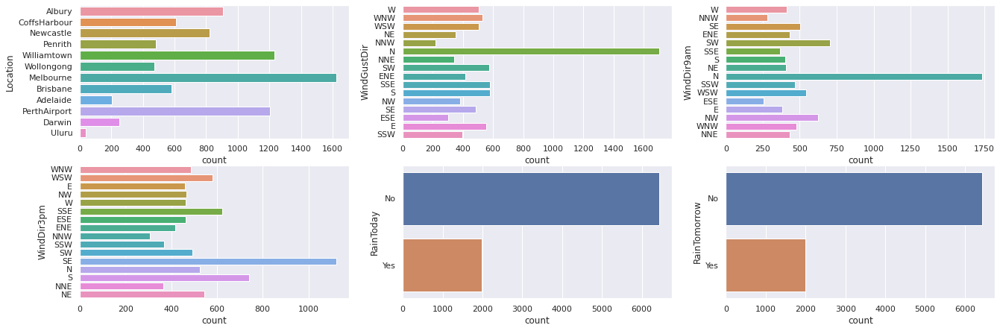

In [ ]:
sns.set()
fig,axes=plt.subplots(2,3,figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
k=0
j=0
for i in df.iloc[:,1:]:
  if df[i].dtypes=='O':
    sns.countplot(y=df[i],ax=axes[j,k])
    print(df[i].value_counts())
    print("\n")
    k=k+1

  
  if k==3:
    k=0
    j=j+1

In [ ]:
a=[]
for i in df["Date"]:
  a.append(i[:4])

b=[]
for i in a:
  if i not in b:
    b.append(i)
b

['2008',
 '2009',
 '2010',
 '2011',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2012']

- Finding the unique year value from Date

Number of times weather is forecasted at each Location between (2008-2017)         
- Melbourne       - 1622
- Williamtown     - 1230
- PerthAirport    - 1204
- Albury           - 907
- Newcastle        - 822
- CoffsHarbour     - 611
- Brisbane         - 579
- Penrith          - 482
- Wollongong       - 474
- Darwin           - 250
- Adelaide         - 205
- Uluru             - 39

Number of times each direction had strongest wind gust between (2008-2017) 
- N  (North) -    1704
- SSE (South-Southeast) -    578
- S (South) -      577
- SW (South-West) -     572
- E    (East) -   557
- WNW    (West-NorthWest) 531
- W (West)       507
- WSW  (West-Southwest) -   504
- SE   (South-East) -   484
- ENE  (East-Northeast) -   415
- SSW (South-Southwest) -    396
- NW   (North-West)   383
- NE   (North-East) -   353
- NNE  (North-NorthEast) -   343
- ESE   (East-SouthEast) -  302
- NNW  (North-Northwest) -   219


Number of times each direction had strongest Wind at 9am between (2008-2017)
- N      - 1735
- SW      - 704
- NW      - 625
- WSW     - 543
- SE      - 505
- WNW     - 480
- SSW     - 467
- ENE     - 433
- NNE     - 430
- W       - 414
- NE      - 409
- S       - 402
- E       - 380
- SSE     - 365
- NNW     - 280
- ESE     - 253

Number of times each direction had strongest Wind at 3pm between (2008-2017)
- SE     1121
- S       742
- SSE     623
- WSW     580
- NE      544
- N       524
- SW      494
- WNW     487
- NW      468
- W       462
- ESE     462
- E       460
- ENE     417
- SSW     370
- NNE     365
- NNW     306

RainToday between (2008-2017)
- 6435 times it was predicted that it wouldn't rain that day
- 1990 times it was predicted that it would rain that day

RainTomorrow between (2008-2017)   
- 6434 times it was predicted that it wouldn't rain the next day
- 1991 times it was predicted that it would rain the next day





13.193305389221557
23.859976090854747
2.805913255956017
40.174468657519505
13.847646424721523
18.533661937965856
67.8224958163997
51.2497897392767
1017.640233277122
1015.2360747926331
4.566622251832112
4.503182579564489
17.76201457760784
22.442934325849443


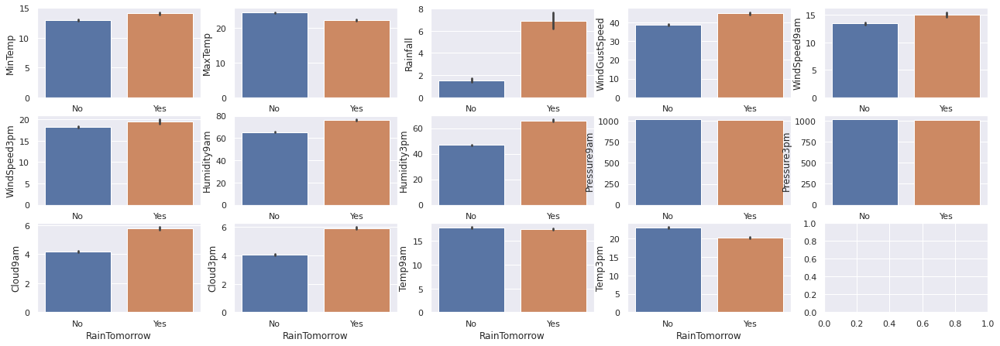

In [ ]:
sns.set()
fig,axes=plt.subplots(3,5,figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
k=0
j=0
for i in df.iloc[:,1:]:
  if df[i].dtypes=='float64':
    sns.barplot(x=df["RainTomorrow"],y=df[i],ax=axes[j,k])
    print(df[i].value_counts())
    k=k+1

  
  if k==5:
    k=0
    j=j+1

Min Temp 
- Min Temp > aprrox. 14c then the Rain is expected Tomorrow 
- Min Temp < aprrox. 14c then there will be no rain.

MaxTemp
- Max Temp > approx. 22c then no rain is expected tomorrow 
- Max Temp < approx. 22c then there will be rain.

Rainfall
- Rainfall > 6mm then it will rain tomorrow 
- Rainfall < 2mm then it wont rain tomorrow

WindGustSpeed
- WindGustSpeed > 40km/hr (approx.) then it will rain tomorrow
- WindGustSpeed < 40km/hr (approx.) then it wont rain tomorrow

WindSpeed9am	
- WindSpeed9am > 15km/hr (approx.)then it will rain tomorrow
- WindSpeed9am < 15km/hr (approx.)then it wont rain tomorrow

WindSpeed3pm	
- WindSpeed9am > 19km/hr (approx.) then it will rain tomorrow
- WindSpeed9am < 19km/hr (approx.) then it wont rain tomorrow

Humidity9am	
- Humidity9am	> 70% (approx.) then it will rain tomorrow
- Humidity9am	< 70% (approx.) then it wont rain tomorrow

Humidity3pm	
- Humidity3pm	> 60% (approx.) then it will rain tomorrow
- Humidity3pm	< 50% (approx.) then it wont rain tomorrow

Pressure9am	
- Pressure9am	> 1000hpa (approx.) then it wont rain tomorrow
- Pressure9am	<= 1000hpa (approx.) then it will rain tomorrow

Pressure3pm	
- Pressure3pm > 1000 (approx.) then it wont rain tomorrow
- Pressure3pm <= 1000 (approx.) then it will rain tomorrow

Cloud9am	
- Cloud9am > 5% (approx.) then it will rain tomorrow
- Cloud9am < 5% (approx.) then it wont rain tomorrow

Cloud3pm
- Cloud3pm > 5% (approx.) then it will rain tomorrow
- Cloud3pm < 5% (approx.) then it wont rain tomorrow

Temp9am	
- Temp9am	> 16c (approx.) then it wont rain tomorrow
- Temp9am	< 16c (approx.) then it will rain tomorrow

Temp3pm
- Temp3pm > 20c (approx.) then it wont rain tomorrow
- Temp3pm < 20c (approx.) then it will rain tomorrow




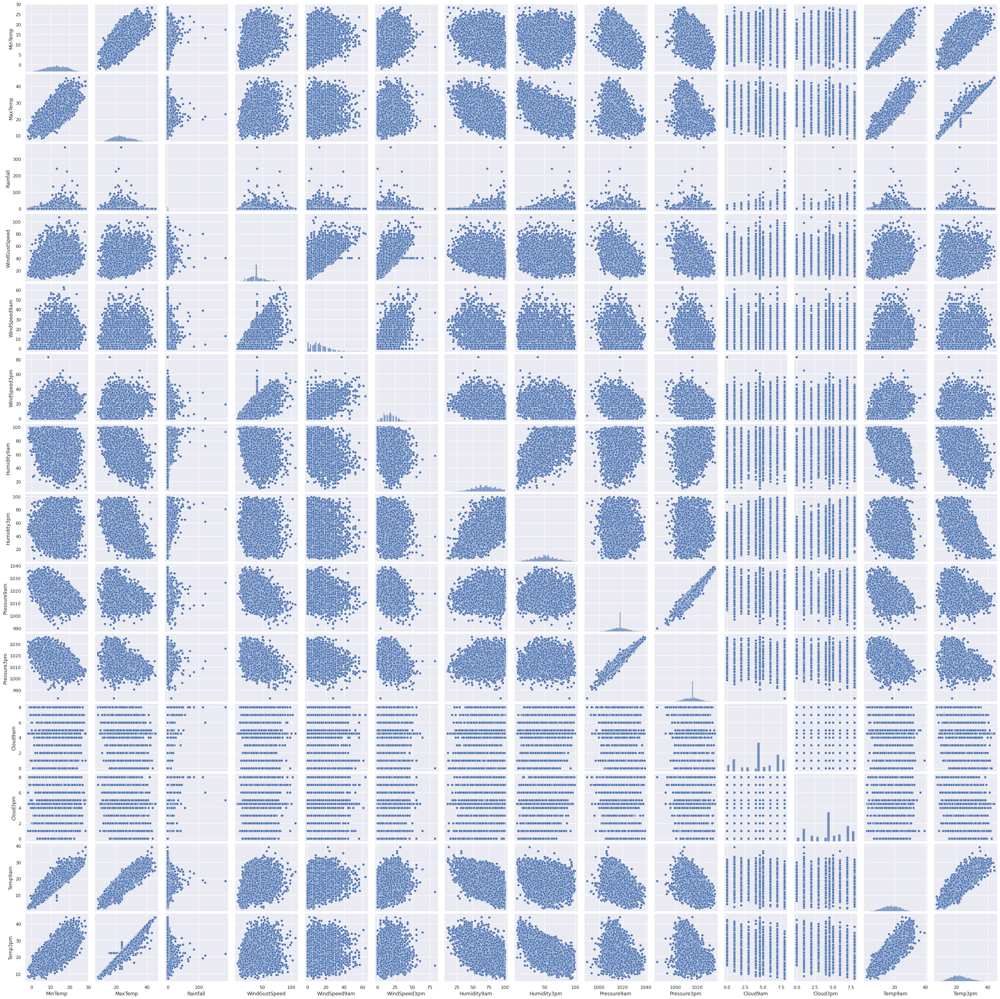

In [ ]:
sns.pairplot(df)

#Describing Data

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.379488,6.114516,10.309308,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.200000,23.300000,0.000000,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


- There is huge gap between 75% and Max value which indicates presence of outlier in some of the features.

- Data is widely spread in most of the features.

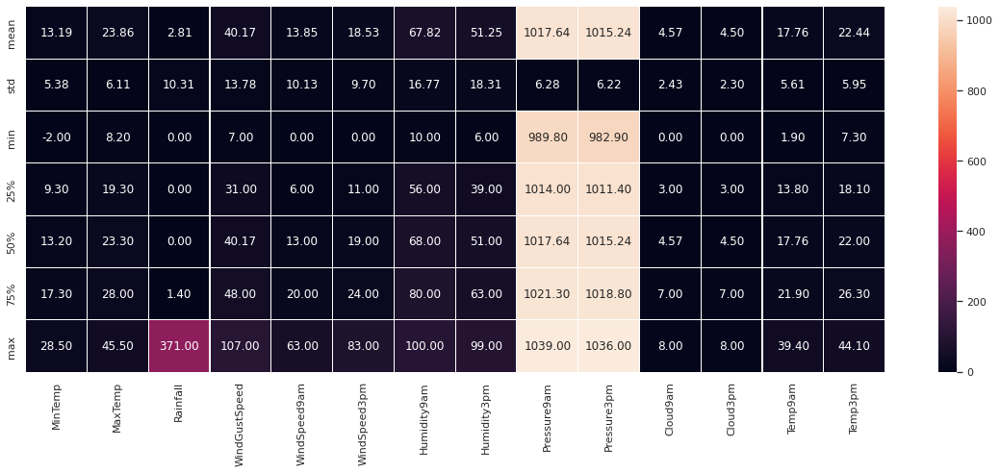

In [ ]:
plt.figure(figsize=(20,7))
sns.heatmap(df.describe()[1:],annot=True,linewidths=0.1,linecolor="white",fmt="0.2f")

MinTemp	
- mean -	13.193305	
- std	- 5.379488
- min	- -2.000000
- max -	28.500000	

MaxTemp	
- mean -	23.859976
- std	- 6.114516
- min	- 8.200000	
- max -	45.500000	

Rainfall	
- mean -	2.805913
- std	- 10.309308	
- min	- 0.000000	
- max -	371.000000

WindGustSpeed	
- mean -	40.174469	
- std	- 	13.776101	
- min	- 7.000000
- max -	107.000000	

WindSpeed9am	
- mean -	13.847646	
- std	- 10.128579	
- min	- 	0.000000
- max -	63.000000	

WindSpeed3pm	
- mean -	18.533662	
- std	- 	9.704759	
- min	- 	0.000000	
- max -		83.000000	

Humidity9am	
- mean -		67.822496	
- std	- 16.774231	
- min	- 10.000000	
- max -	100.000000	

Humidity3pm	
- mean -	51.249790	
- std	- 	18.311894	
- min	- 6.000000	
- max -	99.000000	

Pressure9am	
- mean -	1017.640233	
- std	- 6.275759	
- min	- 989.800000	
- max -	1039.000000	

Pressure3pm	
- mean -		1015.236075	
- std	- 6.217451	
- min	-	982.900000	
- max -	1036.000000	

Cloud9am	
- mean -	4.566622	
- std	- 2.429205	
- min	- 0.000000	
- max -	8.000000	

Cloud3pm	
- mean -	4.503183	
- std	- 2.299419	
- min	- 0.000000	
- max -	8.000000	

Temp9am	
- mean -	17.762015	
- std	- 5.608301
- min	- 1.900000	
- max -	39.400000	

Temp3pm
- mean -	22.442934
- std	- 5.945849
- min	- 7.300000
- max -	44.100000

# Encoding Categorical Features

In [ ]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [ ]:
from sklearn.preprocessing import LabelEncoder
enc=LabelEncoder()
for i in new_df_cap:
  if df[i].dtypes==object:
    df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [ ]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
1,1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2,2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
3,3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
4,4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0


# Checking correlation

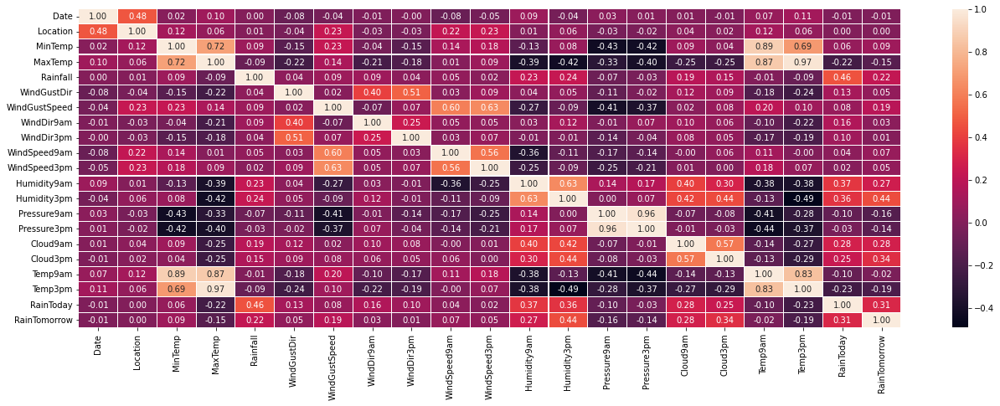

In [ ]:
plt.figure(figsize=(22,7))
sns.heatmap(df.corr(),annot=True,linecolor="white",linewidths=0.1,fmt="0.2f")

- Date has -1 percent correlation with target column which is considered as a very weak +ve bond.
- MinTemp has 9 percent correlation with target column which is considered as a very weak +ve bond.
- MaxTemp has -15 percent correlation with target column which is considered as a weak -ve bond.
- Rainfall has 22 percent correlation with target column which is considered as a weak +ve bond.
- WindGustDir has 5 percent correlation with target column which is considered as a very weak +ve bond.
- WindGustSpeed has 19 percent correlation with target column which is considered as a very weak +ve bond.
- WindDir9am has 3 percent correlation with target column which is considered as a very weak +ve bond.
- WindDir3pm has 1 percent correlation with target column which is considered as a very weak +ve bond.
- WindSpeed9am has 7 percent correlation with target column which is considered as a very weak +ve bond.
- WindSpeed3pm has 5 percent correlation with target column which is considered as a very weak +ve bond.
- Humidity9am has 27 percent correlation with target column which is considered as a weak +ve bond.
- Humidity3pm has 44 percent correlation with target column which is considered as a good +ve bond.
- Pressure9am has -16 percent correlation with target column which is considered as a weak -ve bond.
- Pressure3pm has -18 percent correlation with target column which is considered as a weak -ve bond.
- Cloud9am has 28 percent correlation with target column which is considered as a weak +ve bond.
- Cloud3pm has 34 percent correlation with target column which is considered as a weak +ve bond.
- Temp9am has -2 percent correlation with target column which is considered as a very weak -ve bond.
- Temp3pm has -19 percent correlation with target column which is considered as a weak -ve bond.
- RainToday has 31 percent correlation with target column which is considered as a weak +ve bond.

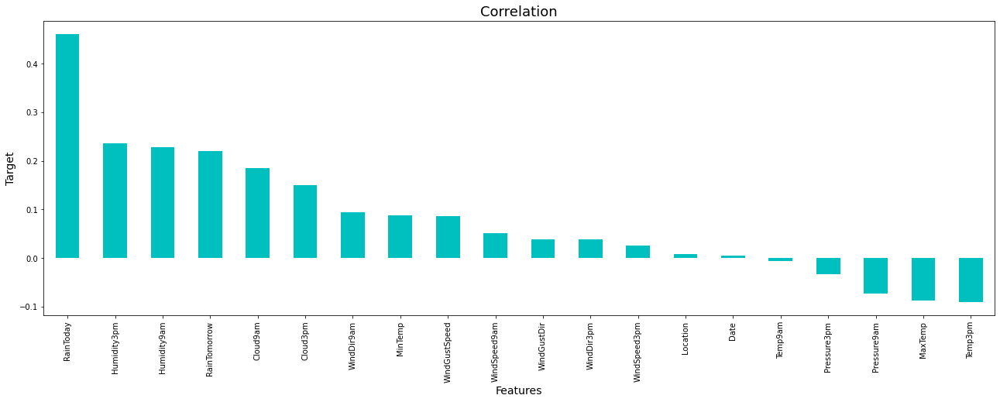

In [ ]:
plt.figure(figsize=(22,7))
df.corr()["Rainfall"].sort_values(ascending=False).drop(["Rainfall"]).plot(kind="bar",color="c")
plt.xlabel('Features',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

- Max +ve correlation - RainToday
- Min +ve correlation - Location
- Max -ve correlation - Temp3pm
- Min -ve correlation - Date

#Detecting Outliers

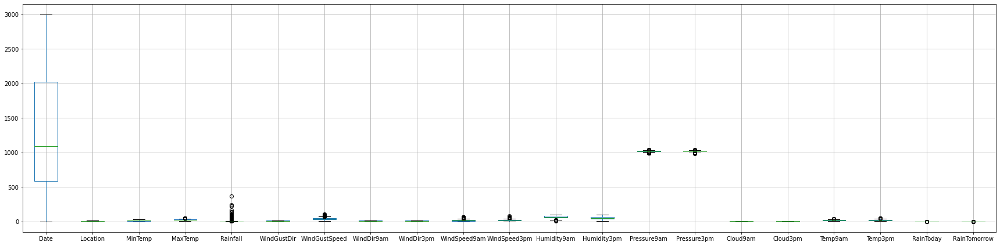

In [ ]:
df.iloc[:,:].boxplot(figsize=(30,7))
plt.subplots_adjust(bottom=0.1)
plt.show()

Followin features have outliers
- MaxTemp
- Rainfall
- WindGustSpeed
- WindSpeed9am
- WindGustSpeed
- WindSpeed9am
- WindSpeed3pm
- Humidity9am
- Pressure9am
- Pressue3pm
- Temp9am
- Temp3pm
- RainToday
- Rain Tomorrow

Only MaxTemp, Rainfall,WindGustSpeed, WindSpeed9am, WIndSpeed3pm, Humidity9am, Pressure9am, Pressure9pm, Temp9am, Temp3pm are non categorical features and hence their outlier can be removed.

In [ ]:
new_df_cap=df.copy()

In [ ]:
def remove_outliers(n):
  Q3=np.percentile(df[n],75,interpolation="midpoint")
  Q1=np.percentile(df[n],25,interpolation="midpoint")
  iqr=Q3-Q1
  percentile25=df[n].quantile(0.25)
  percentile75=df[n].quantile(0.75)
  upper_limit=percentile75+1.5*iqr
  lower_limit=percentile25-1.5*iqr
  df[df[n]>upper_limit]
  df[df[n]<lower_limit]

  new_df=df[df[n]<upper_limit]
  
  new_df_cap[n]=np.where(
      new_df_cap[n] > upper_limit,
      upper_limit,
      np.where(
          new_df_cap[n] < lower_limit,
          lower_limit,
          new_df_cap[n] ) 
      )
  sns.boxplot(new_df_cap[n])

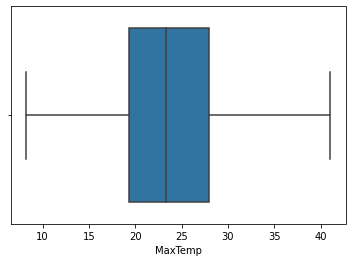

In [ ]:
remove_outliers("MaxTemp")

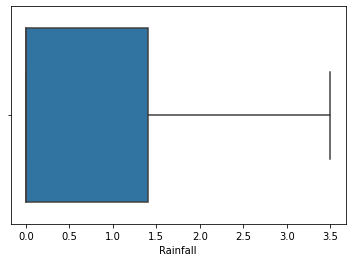

In [ ]:
remove_outliers("Rainfall")

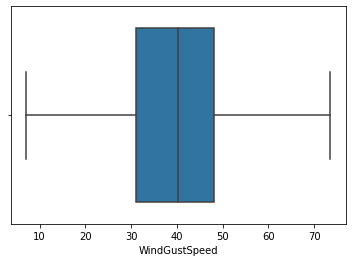

In [ ]:
remove_outliers("WindGustSpeed")

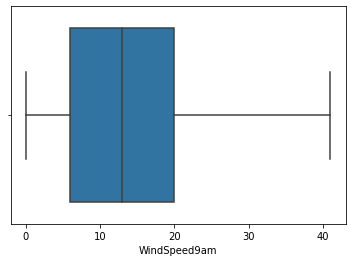

In [ ]:
remove_outliers("WindSpeed9am")

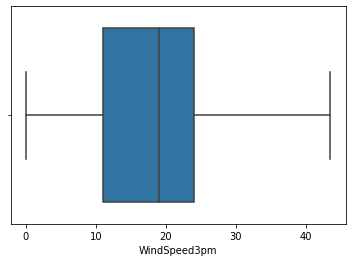

In [ ]:
remove_outliers("WindSpeed3pm")

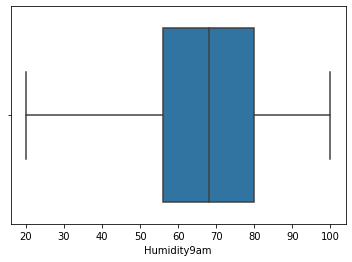

In [ ]:
remove_outliers("Humidity9am")

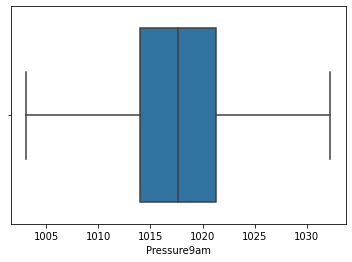

In [ ]:
remove_outliers("Pressure9am")

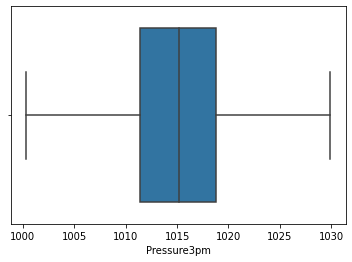

In [ ]:
remove_outliers("Pressure3pm")

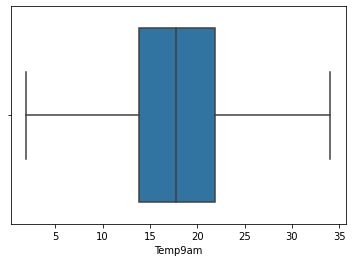

In [ ]:
remove_outliers("Temp9am")

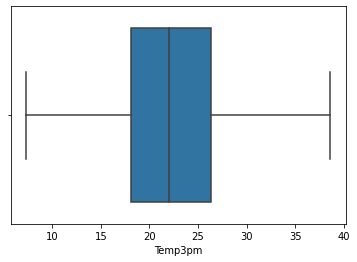

In [ ]:
remove_outliers("Temp3pm")

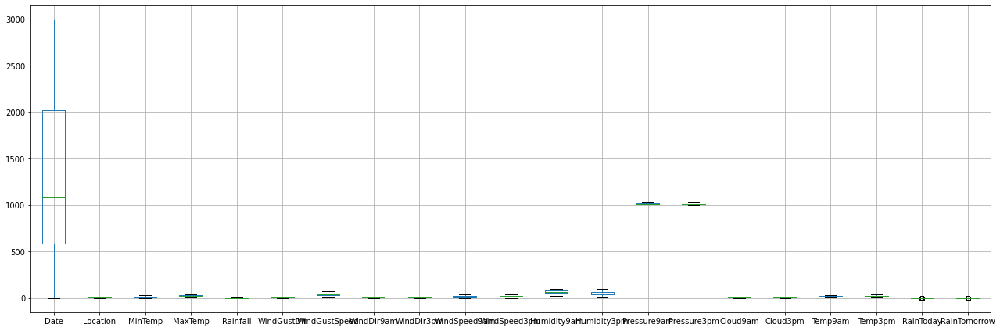

In [ ]:
new_df_cap.iloc[:,:].boxplot(figsize=(22,7))
plt.subplots_adjust(bottom=0.1)
plt.show()

#Separating input and output features

In [ ]:
x=new_df_cap.drop(["RainTomorrow"],axis=1)
x.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0,1,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0
1,1,1,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0
2,2,1,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0
3,3,1,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0
4,4,1,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0


In [ ]:
y=new_df_cap["RainTomorrow"]
y.head()

0    0
1    0
2    0
3    0
4    0
Name: RainTomorrow, dtype: int64

#Checking Skewness

In [ ]:
x.skew().sort_values()

Cloud9am        -0.366503
Cloud3pm        -0.276294
Humidity9am     -0.241038
WindDir3pm      -0.119847
MinTemp         -0.089989
Location        -0.050456
Temp9am         -0.021897
Pressure9am     -0.002350
Pressure3pm      0.014310
Humidity3pm      0.118281
WindGustDir      0.119640
WindDir9am       0.172792
WindSpeed3pm     0.334774
Temp3pm          0.357148
MaxTemp          0.358988
Date             0.386560
WindGustSpeed    0.508772
WindSpeed9am     0.737551
Rainfall         1.219234
RainToday        1.242362
dtype: float64

Keeping +/- 0.5 as the skew range, following features can be considered skewed
- WindGustSpeed
- WindSpeed9am
- RainTomorrow
- RainToday

Since WindGustSpeed, WindSpeed9am are the only two non categorical feature with skewness, hence its skewness can be removed

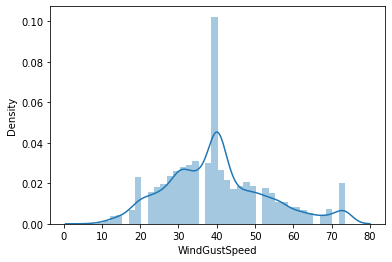

In [ ]:
sns.distplot(x["WindGustSpeed"])

- The feature is right skewed

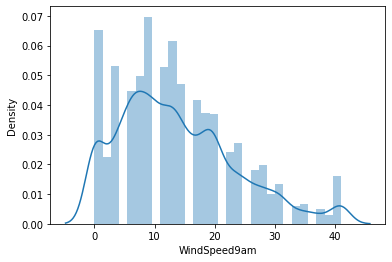

In [ ]:
sns.distplot(x["WindSpeed9am"])

- The feature is right skewed

In [ ]:
from sklearn.preprocessing import power_transform
x["WindGustSpeed"]=power_transform(x["WindGustSpeed"].values.reshape(-1,1))
x["WindSpeed9am"]=power_transform(x["WindSpeed9am"].values.reshape(-1,1))

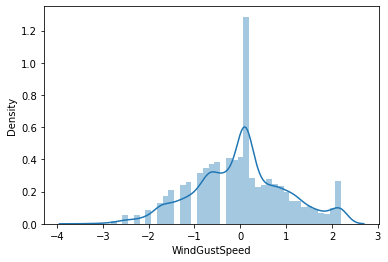

In [ ]:
sns.distplot(x["WindGustSpeed"])

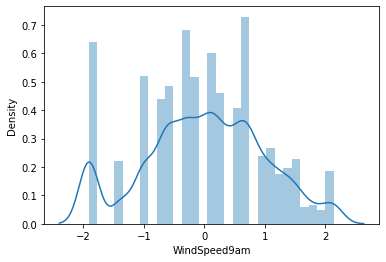

In [ ]:
sns.distplot(x["WindSpeed9am"])

- The feature is not normally distributed, hence we test further.

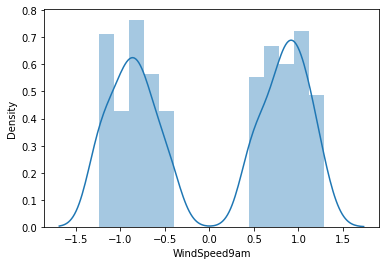

In [ ]:
n=np.cbrt(x["WindSpeed9am"])
sns.distplot(n)

- There is improvement in the distribution

In [ ]:
x["WindSpeed9am"]=np.cbrt(x["WindSpeed9am"])
x["WindSpeed9am"].skew()

-0.05007020032907847

In [ ]:
x.skew().sort_values()

Cloud9am        -0.366503
Cloud3pm        -0.276294
Humidity9am     -0.241038
WindDir3pm      -0.119847
MinTemp         -0.089989
Location        -0.050456
WindSpeed9am    -0.050070
Temp9am         -0.021897
Pressure9am     -0.002350
WindGustSpeed   -0.000907
Pressure3pm      0.014310
Humidity3pm      0.118281
WindGustDir      0.119640
WindDir9am       0.172792
WindSpeed3pm     0.334774
Temp3pm          0.357148
MaxTemp          0.358988
Date             0.386560
Rainfall         1.219234
RainToday        1.242362
dtype: float64

# Detecting Multicollinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):
  vif=pd.DataFrame()
  vif["variable"]=X.columns
  vif["VIF"]=[variance_inflation_factor(X.values,i) for i in range(X.shape[1]) ]

  return (vif)

In [ ]:
calc_vif(x)

,variable,VIF
0,Date,4.847678
1,Location,6.716468
2,MinTemp,57.973077
3,MaxTemp,421.191240
4,Rainfall,7.452447
5,WindGustDir,5.315869
6,WindGustSpeed,2.176631
7,WindDir9am,4.703619
8,WindDir3pm,6.017830
9,WindSpeed9am,1.825606


- Since VIF>5, it indicates presence of multicollinearity
- After looking at the correlation matrix, it was observed that the "Pressure3pm","Temp3pm" contribution towards the target column is slightly less, hence we drop these features.

In [ ]:
X=x.drop(["Pressure3pm","Temp3pm"],axis=1)
calc_vif(X)

,variable,VIF
0,Date,4.845681
1,Location,6.703359
2,MinTemp,56.548256
3,MaxTemp,147.688354
4,Rainfall,7.428019
5,WindGustDir,5.269930
6,WindGustSpeed,2.156715
7,WindDir9am,4.629099
8,WindDir3pm,5.731099
9,WindSpeed9am,1.825331


#Oversampling

In [ ]:
y.value_counts()

0    6434
1    1991
Name: RainTomorrow, dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
x_new,y_new=smt.fit_resample(X,y)

y=y_new
y.value_counts()

0    6434
1    6434
Name: RainTomorrow, dtype: int64

#Scaling 

In [ ]:
from sklearn.preprocessing import MinMaxScaler
mns=MinMaxScaler()
s=mns.fit_transform(x_new)
x=pd.DataFrame(data=s)
print(x)


             0         1         2         3         4         5         6   \
0      0.000000  0.090909  0.504918  0.447489  0.171429  0.866667  0.678135   
1      0.000333  0.090909  0.308197  0.514460  0.000000  0.933333  0.678135   
2      0.000666  0.090909  0.488525  0.532725  0.000000  1.000000  0.703070   
3      0.000999  0.090909  0.367213  0.602740  0.000000  0.266667  0.385490   
4      0.001332  0.090909  0.639344  0.733638  0.285714  0.866667  0.639577   
...         ...       ...       ...       ...       ...       ...       ...   
12863  0.038961  1.000000  0.677956  0.457969  0.444536  0.266667  0.658168   
12864  0.125208  0.363636  0.628549  0.549195  0.000000  0.666667  0.838072   
12865  0.268398  0.454545  0.645349  0.601811  0.165809  0.333333  0.647552   
12866  0.640027  0.545455  0.368530  0.384139  0.015985  0.400000  0.571526   
12867  0.182817  0.272727  0.521228  0.380260  1.000000  0.733333  0.775254   

             7         8         9         10      

# Training and Testing

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score,accuracy_score,classification_report,auc,roc_curve
from sklearn.model_selection import train_test_split,cross_val_score
lg=LogisticRegression()


In [ ]:
for i in range(1000):
  x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
  lg.fit(x,y)
  pred_train=lg.predict(x_train)
  pred_test=lg.predict(x_test)
  if round(accuracy_score(y_train,pred_train)*100,2)==round(accuracy_score(y_test,pred_test)*100,2):
    print("At Random State : ",i)
    print("Train Accuracy : ",round(accuracy_score(y_train,pred_train)*100,2))
    print("Test Accuracy : ",round(accuracy_score(y_test,pred_test)*100,2))
    print("\n")

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=999)
lg.fit(x,y)
pred_train=lg.predict(x_train)
pred_test=lg.predict(x_test)
print("Train Accuracy : ",round(accuracy_score(y_train,pred_train)*100,2))
print("Test Accuracy : ",round(accuracy_score(y_test,pred_test)*100,2))

Train Accuracy :  79.15
Test Accuracy :  78.75


In [ ]:
print("Classification Report:\n",classification_report(y_test,pred_test))

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.79      0.79      1318
           1       0.78      0.78      0.78      1256

    accuracy                           0.79      2574
   macro avg       0.79      0.79      0.79      2574
weighted avg       0.79      0.79      0.79      2574



#Cross Validation

In [ ]:
ls=accuracy_score(y_test,pred_test)

for j in range(2,20):
  cv_score=cross_val_score(lg,x,y,cv=j)
  print(cv_score)
  print("At cv:",j)
  print("cv score : ", cv_score.mean()*100)
  print("Accuracy : ",ls*100)
  print("\n")

[0.708424   0.78333851]
At cv: 2
cv score :  74.58812558284116
Accuracy :  78.74902874902875


[0.71748252 0.65586384 0.82676615]
At cv: 3
cv score :  73.33708337205657
Accuracy :  78.74902874902875


[0.70345042 0.63972645 0.71370842 0.85265776]
At cv: 4
cv score :  72.7385763133354
Accuracy :  78.74902874902875


[0.6981352  0.68414918 0.68181818 0.76758647 0.86397202]
At cv: 5
cv score :  73.91322112270421
Accuracy :  78.74902874902875


[0.68857809 0.68158508 0.61678322 0.71235431 0.7863806  0.86240672]
At cv: 6
cv score :  72.46813354555891
Accuracy :  78.74902874902875


[0.73191952 0.65742251 0.75299238 0.73993471 0.71436344 0.82807399
 0.86452666]
At cv: 7
cv score :  75.56047456836846
Accuracy :  78.74902874902875


[0.74953387 0.67184587 0.77563704 0.66376631 0.72325871 0.77114428
 0.85074627 0.86131841]
At cv: 8
cv score :  75.84063445977077
Accuracy :  78.74902874902875


[0.76503497 0.66713287 0.73496503 0.6972028  0.74755245 0.73006993
 0.76993007 0.86424073 0.86494052]
A

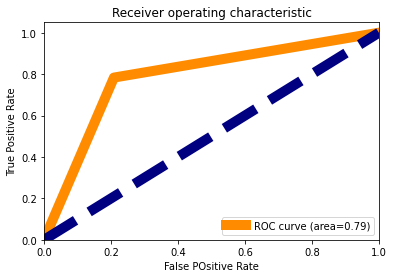

In [ ]:
fpr,tpr,thresholds=roc_curve(pred_test,y_test)
roc_auc=auc(fpr,tpr)
plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area=%0.2f)'%roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False POsitive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc='lower right')
plt.show()


#Model Selection

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve,auc

def model_selection(algorithm_instance,x_train,y_train,x_test,y_test):
    algorithm_instance.fit(x_train,y_train)
    model_pred_train=algorithm_instance.predict(x_train)
    model_pred_test=algorithm_instance.predict(x_test)
    print("Accuracy of training model :",round(accuracy_score(y_train,model_pred_train)*100,2))
    print("Accuracy of test data :",round(accuracy_score(y_test,model_pred_test)*100,2))
    cv_score=cross_val_score(algorithm_instance,x,y,cv=5)
    print("cv score : ", round(cv_score.mean()*100,2))
    print("\nClassification report for test data\n",classification_report(y_test,model_pred_test))
    print("Classification report for training data\n",classification_report(y_train,model_pred_train))
    print("Confusion Matrix\n",confusion_matrix(y_test,model_pred_test))
    print("\n")
   
    fpr, tpr, thresholds = roc_curve(model_pred_test,y_test)
    roc_auc= auc(fpr,tpr)
    plt.figure()
    plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0,1.05])
    plt.xlabel("False POsitive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic")
    plt.legend(loc='lower right')
    plt.show()


#KNeighbors Classifier

Accuracy of training model : 90.56
Accuracy of test data : 84.97
cv score :  71.95

Classification report for test data
               precision    recall  f1-score   support

           0       0.91      0.78      0.84      1318
           1       0.80      0.92      0.86      1256

    accuracy                           0.85      2574
   macro avg       0.86      0.85      0.85      2574
weighted avg       0.86      0.85      0.85      2574

Classification report for training data
               precision    recall  f1-score   support

           0       0.95      0.86      0.90      5116
           1       0.87      0.95      0.91      5178

    accuracy                           0.91     10294
   macro avg       0.91      0.91      0.91     10294
weighted avg       0.91      0.91      0.91     10294

Confusion Matrix
 [[1032  286]
 [ 101 1155]]




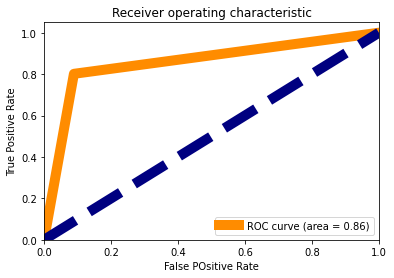

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

k=KNeighborsClassifier()
model_selection(k,x_train,y_train,x_test,y_test)

# SVM Model

Accuracy of training model : 86.13
Accuracy of test data : 83.29
cv score :  73.6

Classification report for test data
               precision    recall  f1-score   support

           0       0.84      0.83      0.84      1318
           1       0.83      0.83      0.83      1256

    accuracy                           0.83      2574
   macro avg       0.83      0.83      0.83      2574
weighted avg       0.83      0.83      0.83      2574

Classification report for training data
               precision    recall  f1-score   support

           0       0.86      0.86      0.86      5116
           1       0.86      0.86      0.86      5178

    accuracy                           0.86     10294
   macro avg       0.86      0.86      0.86     10294
weighted avg       0.86      0.86      0.86     10294

Confusion Matrix
 [[1100  218]
 [ 212 1044]]




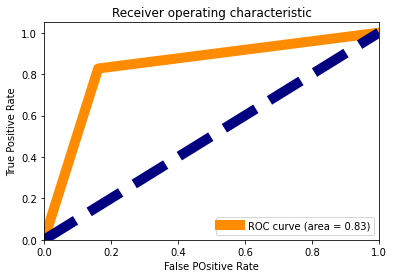

In [ ]:
from sklearn import svm
s=svm.SVC()
model_selection(s,x_train,y_train,x_test,y_test)

# DecisionTressClassifier Model

Accuracy of training model : 100.0
Accuracy of test data : 85.47
cv score :  72.54

Classification report for test data
               precision    recall  f1-score   support

           0       0.87      0.85      0.86      1318
           1       0.84      0.86      0.85      1256

    accuracy                           0.85      2574
   macro avg       0.85      0.85      0.85      2574
weighted avg       0.86      0.85      0.85      2574

Classification report for training data
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5116
           1       1.00      1.00      1.00      5178

    accuracy                           1.00     10294
   macro avg       1.00      1.00      1.00     10294
weighted avg       1.00      1.00      1.00     10294

Confusion Matrix
 [[1114  204]
 [ 170 1086]]




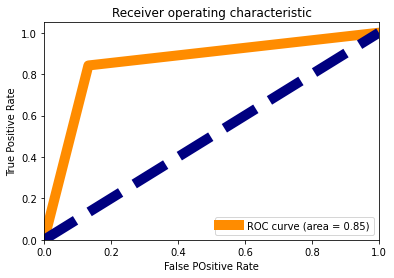

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
model_selection(dtc,x_train,y_train,x_test,y_test)

# Ensemble Methods

# RandomForestClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parameter={'criterion':['gini', 'entropy', 'log_loss'],
          'max_features' : [None,"sqrt","log2"],
           'class_weight':['balanced',' balanced_subsample'],
           'oob_score':['True','False'],
           'n_estimators':range(0,100,25)}

rf=RandomForestClassifier()
clf=GridSearchCV(rf,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 50, 'oob_score': 'False'}


Accuracy of training model : 100.0
Accuracy of test data : 92.85
cv score :  80.54

Classification report for test data
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      1318
           1       0.92      0.93      0.93      1256

    accuracy                           0.93      2574
   macro avg       0.93      0.93      0.93      2574
weighted avg       0.93      0.93      0.93      2574

Classification report for training data
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5116
           1       1.00      1.00      1.00      5178

    accuracy                           1.00     10294
   macro avg       1.00      1.00      1.00     10294
weighted avg       1.00      1.00      1.00     10294

Confusion Matrix
 [[1220   98]
 [  86 1170]]




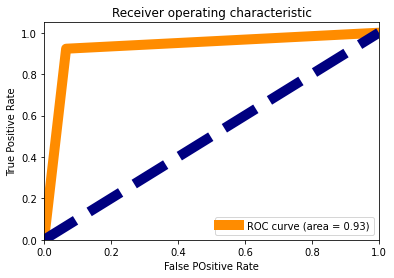

In [ ]:
rf=RandomForestClassifier(n_estimators=50, class_weight= 'balanced',criterion='entropy', max_features= 'log2', oob_score= 'True')
model_selection(rf,x_train,y_train,x_test,y_test)

# AdaBoostClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier

parameter={'algorithm':['SAMME', 'SAMME.R'],
          'learning_rate' : [0.0,1.0],
           'random_state':range(0,100,25),
           'n_estimators':range(0,100,25)}

rf2=AdaBoostClassifier()
clf=GridSearchCV(rf2,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'algorithm': 'SAMME.R', 'learning_rate': 1.0, 'n_estimators': 75, 'random_state': 0}


Accuracy of training model : 84.26
Accuracy of test data : 84.46
cv score :  68.84

Classification report for test data
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      1318
           1       0.84      0.84      0.84      1256

    accuracy                           0.84      2574
   macro avg       0.84      0.84      0.84      2574
weighted avg       0.84      0.84      0.84      2574

Classification report for training data
               precision    recall  f1-score   support

           0       0.83      0.85      0.84      5116
           1       0.85      0.83      0.84      5178

    accuracy                           0.84     10294
   macro avg       0.84      0.84      0.84     10294
weighted avg       0.84      0.84      0.84     10294

Confusion Matrix
 [[1123  195]
 [ 205 1051]]




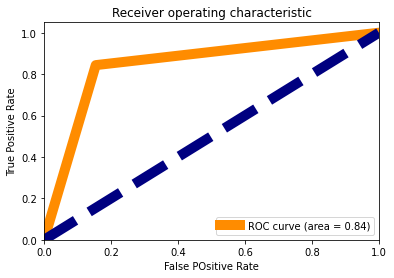

In [ ]:
rf2=AdaBoostClassifier(algorithm='SAMME.R', learning_rate= 1.0, n_estimators= 75,random_state= 0)
model_selection(rf2,x_train,y_train,x_test,y_test)


# GradientBoostingClassifier



In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

parameter={'loss':['log_loss', 'deviance', 'exponential'],
          'learning_rate' : [0.0,1.0],
           'criterion':['friedman_mse', 'squared_error', 'mse'],
           'max_features':['auto', 'sqrt', 'log2'],
           'n_estimators':range(0,100,25)}

rf3=GradientBoostingClassifier()
clf=GridSearchCV(rf3,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'criterion': 'mse', 'learning_rate': 1.0, 'loss': 'deviance', 'max_features': 'auto', 'n_estimators': 75}


Accuracy of training model : 94.59
Accuracy of test data : 89.63
cv score :  68.99

Classification report for test data
               precision    recall  f1-score   support

           0       0.89      0.90      0.90      1318
           1       0.90      0.89      0.89      1256

    accuracy                           0.90      2574
   macro avg       0.90      0.90      0.90      2574
weighted avg       0.90      0.90      0.90      2574

Classification report for training data
               precision    recall  f1-score   support

           0       0.94      0.95      0.95      5116
           1       0.95      0.94      0.95      5178

    accuracy                           0.95     10294
   macro avg       0.95      0.95      0.95     10294
weighted avg       0.95      0.95      0.95     10294

Confusion Matrix
 [[1192  126]
 [ 141 1115]]




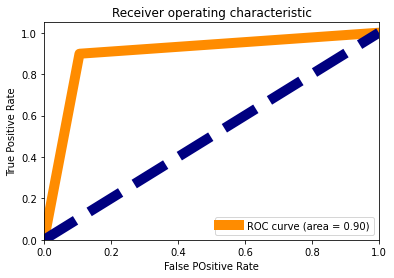

In [ ]:
rf3=GradientBoostingClassifier(criterion='mse',learning_rate=1.0, loss='deviance', max_features= 'auto', n_estimators= 75)
model_selection(rf3,x_train,y_train,x_test,y_test)

# BaggingClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier

parameter={
           'oob_score': [True,False],
           'n_jobs':range(0,100,25),
           'random_state':range(0,100,25),
           'n_estimators':range(0,100,25)}

rf4=BaggingClassifier()
clf=GridSearchCV(rf4,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_estimators': 75, 'n_jobs': 25, 'oob_score': True, 'random_state': 50}


Accuracy of training model : 100.0
Accuracy of test data : 91.84
cv score :  74.31

Classification report for test data
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      1318
           1       0.91      0.93      0.92      1256

    accuracy                           0.92      2574
   macro avg       0.92      0.92      0.92      2574
weighted avg       0.92      0.92      0.92      2574

Classification report for training data
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5116
           1       1.00      1.00      1.00      5178

    accuracy                           1.00     10294
   macro avg       1.00      1.00      1.00     10294
weighted avg       1.00      1.00      1.00     10294

Confusion Matrix
 [[1199  119]
 [  91 1165]]




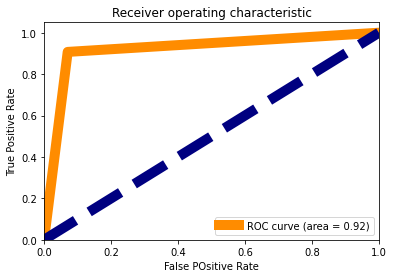

In [ ]:
rf4=BaggingClassifier(n_jobs=25, oob_score= True, random_state=50, n_estimators= 75)
model_selection(rf4,x_train,y_train,x_test,y_test)


# StackingClassifier

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

estimators = [ ('knc', KNeighborsClassifier()), ('svr',SVC()) ]
parameter={
            'stack_method':['auto', 'predict_proba', 'decision_function', 'predict'],
           'n_jobs':range(0,100,25)
         }

rf5=StackingClassifier(estimators)
clf=GridSearchCV(rf5,parameter)
clf.fit(x_train,y_train)

print(clf.best_params_)

{'n_jobs': 25, 'stack_method': 'auto'}


Accuracy of training model : 85.65
Accuracy of test data : 84.15
cv score :  81.61

Classification report for test data
               precision    recall  f1-score   support

           0       0.86      0.83      0.84      1046
           1       0.83      0.86      0.84      1024

    accuracy                           0.84      2070
   macro avg       0.84      0.84      0.84      2070
weighted avg       0.84      0.84      0.84      2070

Classification report for training data
               precision    recall  f1-score   support

           0       0.87      0.84      0.85      4128
           1       0.85      0.87      0.86      4150

    accuracy                           0.86      8278
   macro avg       0.86      0.86      0.86      8278
weighted avg       0.86      0.86      0.86      8278

Confusion Matrix
 [[864 182]
 [146 878]]




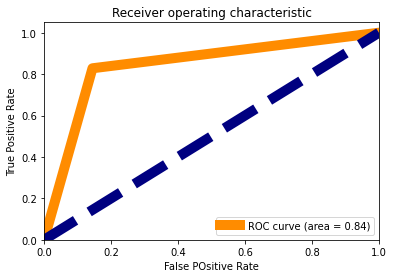

In [ ]:
rf5=StackingClassifier(estimators,n_jobs=25, stack_method= 'auto')
model_selection(rf5,x_train,y_train,x_test,y_test)


# Model Saving

In [ ]:
import pickle
filename='rfz.pk1'
pickle.dump(rf,open(filename,'wb'))

We selected RandomForest Classifier model since
- it has best cross validation score among all the model and high accuracy.
- it has highest auc score of 0.93

# Loading Model

In [ ]:
loaded_model=pickle.load(open('rfz.pk1','rb'))
result=loaded_model.score(x_test,y_test)
print("Model Accuracy: ",result*100)

Model Accuracy:  92.85159285159286


# Testing Loaded Model

In [ ]:
def test_inp():
  inp = []
  i=0
  print("Enter single input\n")
  while i<18:
    inn=float(input(f"Enter input {i+1}: "))
    inp.append(inn)
    i=i+1
  input_data_as_numpy_array = np.asarray(inp)
  input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)
  prediction = loaded_model.predict(input_data_reshaped)
  if prediction[0]==0:
      print("\nRainTomorrow: No")
  if prediction[0]==1:
      print("\nRainTomorrow: Yes")

In [ ]:
print("Input\n",x.head(1),"\n\nOutput\n",y.head(1))

Input
     0         1         2         3         4         5         6         7   \
0  0.0  0.090909  0.504918  0.447489  0.171429  0.866667  0.678135  0.866667   

         8         9         10      11        12        13   14        15  \
0  0.933333  0.846467  0.551724  0.6375  0.172043  0.159247  1.0  0.562898   

         16   17  
0  0.466563  0.0   

Output
 0    0
Name: RainTomorrow, dtype: int64


In above table we have seen that 
- Input 0th row gives output 0 i.e RainTomorrow:No 

In [ ]:
print("Input\n",x.tail(1),"\n\nOutput\n",y.tail(1))

Input
              0         1         2        3    4         5         6   \
12867  0.182817  0.272727  0.521228  0.38026  1.0  0.733333  0.775254   

             7         8         9        10        11       12        13  \
12867  0.933333  0.733333  0.846844  0.64115  0.737712  0.78531  0.300092   

            14        15        16   17  
12867  0.37923  0.873942  0.466616  1.0   

Output
 12867    1
Name: RainTomorrow, dtype: int64


In above table we have seen that 
- Input 0th row gives output 0 i.e RainTomorrow:No 
- Input nth row gives output 1 i.e RainTomorrow:Yes

So we can use this input data with loaded model to test if model gives correct output

In [ ]:
test_inp()

Enter single input

Enter input 1:  0.0  
Enter input 2: 0.090909  
Enter input 3: 0.504918  
Enter input 4: 0.447489  
Enter input 5: 0.171429  
Enter input 6: 0.866667  
Enter input 7: 0.678135  
Enter input 8: 0.866667  
Enter input 9: 0.933333  
Enter input 10: 0.846467  
Enter input 11: 0.551724  
Enter input 12: 0.6375  
Enter input 13: 0.172043  
Enter input 14: 0.159247  
Enter input 15: 1.0
Enter input 16: 0.562898   
Enter input 17: 0.466563
Enter input 18: 0.0

RainTomorrow: No


In [ ]:
test_inp()

Enter single input

Enter input 1:   0.182817   
Enter input 2: 0.272727   
Enter input 3: 0.521228   
Enter input 4: 0.38026 
Enter input 5: 1.0
Enter input 6: 0.733333  
Enter input 7: 0.775254 
Enter input 8: 0.933333  
Enter input 9: 0.733333  
Enter input 10: 0.846844  
Enter input 11: 0.64115  
Enter input 12: 0.737712  
Enter input 13: 0.78531  
Enter input 14: 0.300092 
Enter input 15: 0.37923  
Enter input 16: 0.873942    
Enter input 17: 0.466616
Enter input 18: 1.0

RainTomorrow: Yes
